In [1]:
using DrWatson
@quickactivate "."

In [3]:
using ProgressBars, Suppressor, Pipe, Revise
using Plots, RCall, Statistics
using Ripserer, PersistenceDiagrams, PersistenceDiagramsBase

In [4]:
include(srcdir("wRips.jl"))
import Main.wRips
plot_par = wRips.plot_params(alpha = 0.3);
theme(:dao)

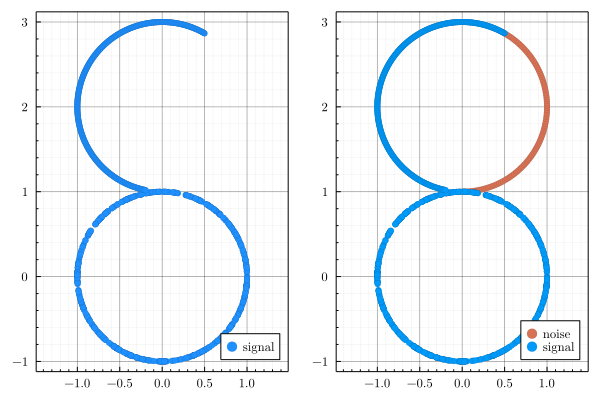

In [18]:
n = 100

X1 = wRips.randCircle(5 * n, σ = 0)
X2 = [(cos(θ), 2 + sin(θ)) for θ in range(π / 3 , 23 * π / 16, length = 3 * n)]

signal = [X1; X2]
signalv = signal |> wRips._ArrayOfTuples_to_ArrayOfVectors
labels = repeat(["signal"], length(signal))

noise = [(cos(θ), 2 + sin(θ)) for θ in range(-π / 2, π / 3, length = n)]
labels = [labels; repeat(["noise"], length(noise))]


Xnt = [signal; noise]
Xn = Xnt |> wRips._ArrayOfTuples_to_ArrayOfVectors
plt_signal = @pipe signal |> scatter(_, ratio = 1, label="signal", c=:dodgerblue, legend=:bottomright);
plt = @pipe Xnt |> scatter(_, groups = labels, ratio = 1, legend = :bottomright);
plot(plt_signal, plt)

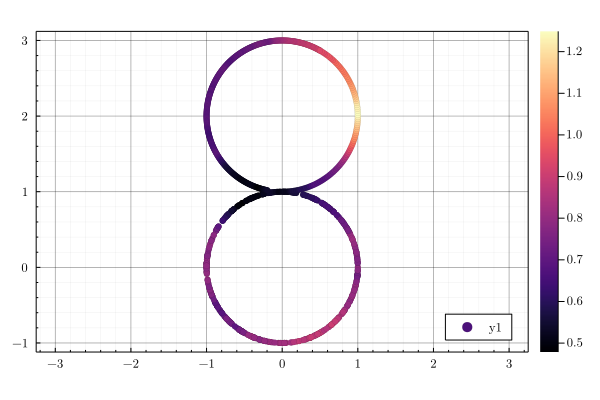

In [20]:
Q = 2 * n + 1
DnQ = wRips.momdist(Xn, Q)
w = wRips.fit(Xn, DnQ)
@pipe Xnt |> scatter(_, ratio = 1, marker_z = w, legend = :bottomright)

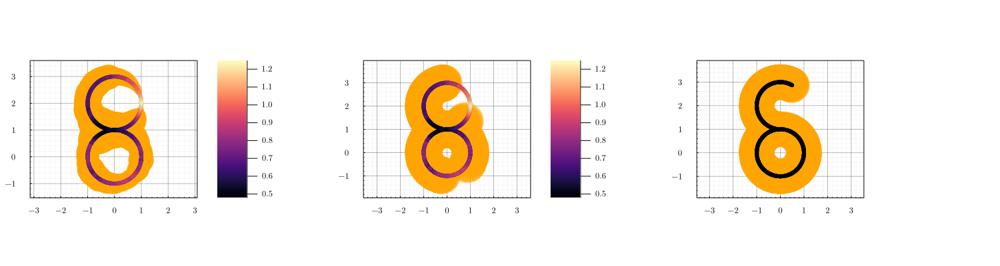

In [44]:
t1 = 1.2
t2 = 0.8
t3 = 0.75
filt_plt1 = wRips.filtration_plot(t1; Xn = Xn, w = w, p = 1, par = plot_par);
filt_plt2 = wRips.filtration_plot(t2; Xn = Xn, w = w, p = Inf, par = plot_par);
filt_plt3 = wRips.filtration_plot(t3; Xn = signalv, w = repeat([0], length(signalv)), p = 1, par = plot_par);
@suppress plot(
    filt_plt1,
    filt_plt2,
    filt_plt3,
    layout=(1,3), size=(1500,400)
) |> display

In [46]:
Dn = ripserer(Xn);
D = ripserer(signal);

┌ Warning: points not unique
└ @ Ripserer /storage/home/s/suv87/work/julia_depot/packages/Ripserer/2Sgvm/src/filtrations/rips.jl:228


In [47]:
DnQ1 = wRips.wrips(Xn, w = w, p = 1)
DnQ2 = wRips.wrips(Xn, w = w, p = 2)
DnQinf = wRips.wrips(Xn, w = w, p = Inf)

2-element Vector{PersistenceDiagram}:
 3-element 0-dimensional PersistenceDiagram
 2-element 1-dimensional PersistenceDiagram

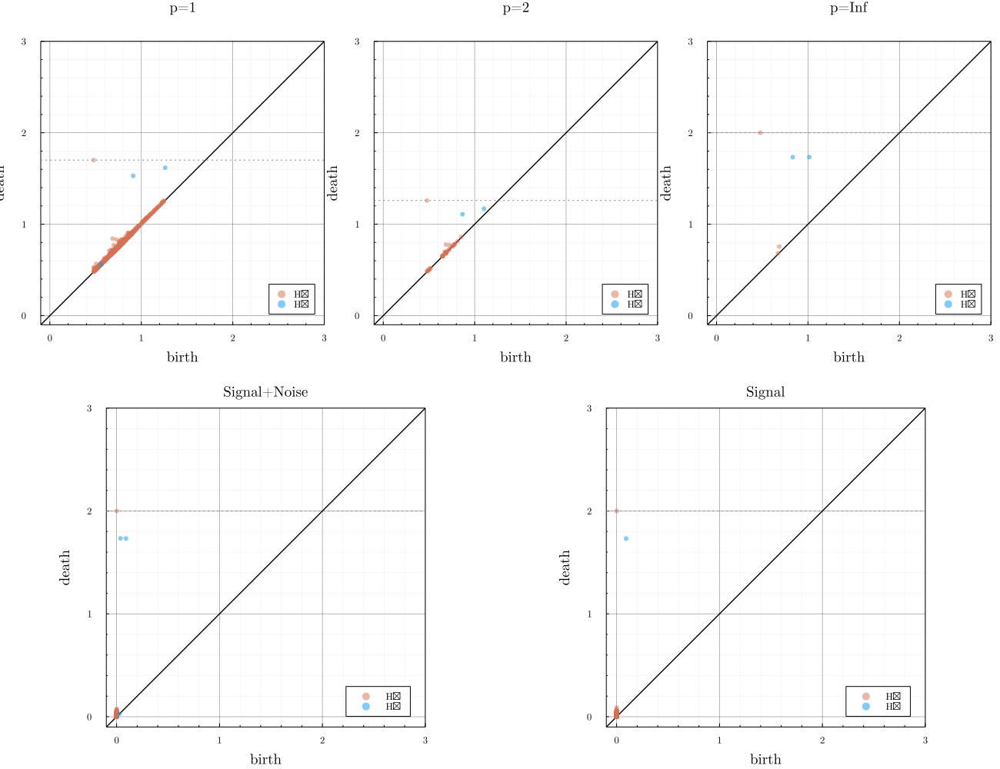

In [48]:
l = @layout [
    [grid(1,3); grid(1,2)  ]
]

@suppress plot(
    plot(DnQ1, lim = (-0.1, 3), title = "p=1"),
    plot(DnQ2, lim = (-0.1, 3), title = "p=2"),
    plot(DnQinf, lim = (-0.1, 3), title = "p=Inf"),
    plot(Dn, lim = (-0.1, 3), title = "Signal+Noise"),
    plot(D, lim = (-0.1, 3), title = "Signal"),
    layout = l, size=(1300,1000)
) |> display

In [58]:
persistence.(DnQ1[2][end-1:end])

2-element Vector{Float64}:
 0.35732959989122315
 0.6173889806426197